In [1]:
import os
import zipfile
import random
from pathlib import Path
import pandas as pd
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# --- Configuration ---

# Dossier de destination pour la décompression
WORKING_DIR = Path(r'D:\Fructueux\Work\Memoire\Computer Vision\Material\Dataset\Final')

# Nom du dossier une fois décompressé (il doit correspondre à ce qui est dans le zip)
DATASET_NAME = 'Dataset_B_640x640'
DATASET_DIR = WORKING_DIR / DATASET_NAME

# Noms des classes dans l'ordre de leurs IDs (0, 1, 2, 3)
CLASS_NAMES = ['Person', 'Bicycle', 'Car', 'Cattle']

# Couleurs pour chaque classe (pour une visualisation claire)
# Vous pouvez choisir les couleurs que vous préférez
COLORS = ['#FF3838', '#FF9D97', '#FF701F', '#FFB21D']

# Configuration de l'affichage pour Matplotlib
plt.rcParams['figure.figsize'] = (15, 15)

In [2]:
def visualize_sample(image_path):
    """
    Ouvre une image, lit son fichier d'annotation YOLO, et dessine les boîtes
    englobantes avec les labels de classe.
    """
    # Ouvrir l'image
    img = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    img_w, img_h = img.size
    
    # Trouver le fichier de label correspondant
    label_path = DATASET_DIR / 'labels' / image_path.parent.name / (image_path.stem + ".txt")
    
    if not label_path.exists():
        print(f"Image: {image_path.name} (Pas d'annotations)")
        return img

    with open(label_path, 'r') as f:
        for line in f:
            if not line.strip():
                continue
            
            # Lire les données YOLO
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            class_id = int(class_id)
            
            # Convertir les coordonnées YOLO en coordonnées pixels
            box_w = width * img_w
            box_h = height * img_h
            x_min = (x_center * img_w) - (box_w / 2)
            y_min = (y_center * img_h) - (box_h / 2)
            x_max = x_min + box_w
            y_max = y_min + box_h
            
            # Dessiner la boîte
            draw.rectangle([x_min, y_min, x_max, y_max], outline=COLORS[class_id], width=3)
            
            # Dessiner le label de la classe
            class_name = CLASS_NAMES[class_id]
            text_size = draw.textlength(class_name)
            draw.rectangle([x_min, y_min - 20, x_min + text_size + 8, y_min], fill=COLORS[class_id])
            draw.text((x_min + 4, y_min - 18), class_name, fill='white')
            
    return img

Nombre total d'images trouvées : 3844


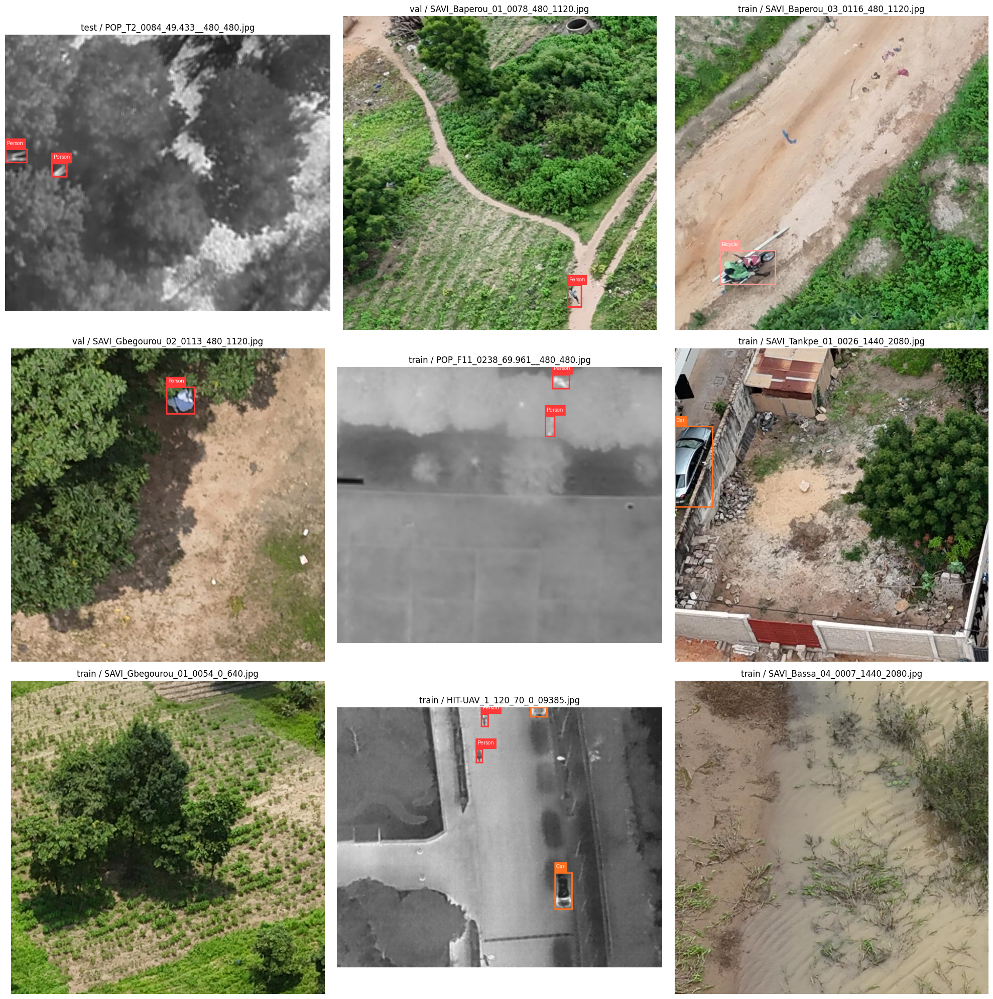

In [3]:
# --- Visualisation Aléatoire ---

# Récupérer la liste de toutes les images
all_image_paths = list((DATASET_DIR / 'images').glob('**/*.jpg'))
print(f"Nombre total d'images trouvées : {len(all_image_paths)}")

# Sélectionner un échantillon aléatoire de 9 images
sample_paths = random.sample(all_image_paths, k=min(9, len(all_image_paths)))

# Afficher les images dans une grille
plt.figure(figsize=(20, 20))
for i, path in enumerate(sample_paths):
    plt.subplot(3, 3, i + 1)
    
    # Utiliser notre fonction pour obtenir l'image avec les annotations
    annotated_img = visualize_sample(path)
    
    plt.imshow(annotated_img)
    plt.title(f"{path.parent.name} / {path.name}") # Affiche le split (train/val/test) et le nom
    plt.axis('off')

plt.tight_layout()
plt.show()

Aperçu du fichier de métadonnées :


,id,angle,altitude,meteo,region,mode,y_start,y_end
0,SAVI_Tourou_04_0078_0_640,45,50,sunny,rural,semi-automatique,0,640
1,SAVI_Gbegourou_01_0067_480_1120,45,60,sunny,rural,automatique,480,1120
2,SAVI_Tankpe_01_0050_480_1120,45,60,cloudy,rural,automatique,480,1120
3,SAVI_Tourou_02_0011_0_640,0,30,sunny,rural,semi-automatique,0,640
4,SAVI_Baperou_01_0051_480_1120,45,60,cloudy,rural,automatique,480,1120


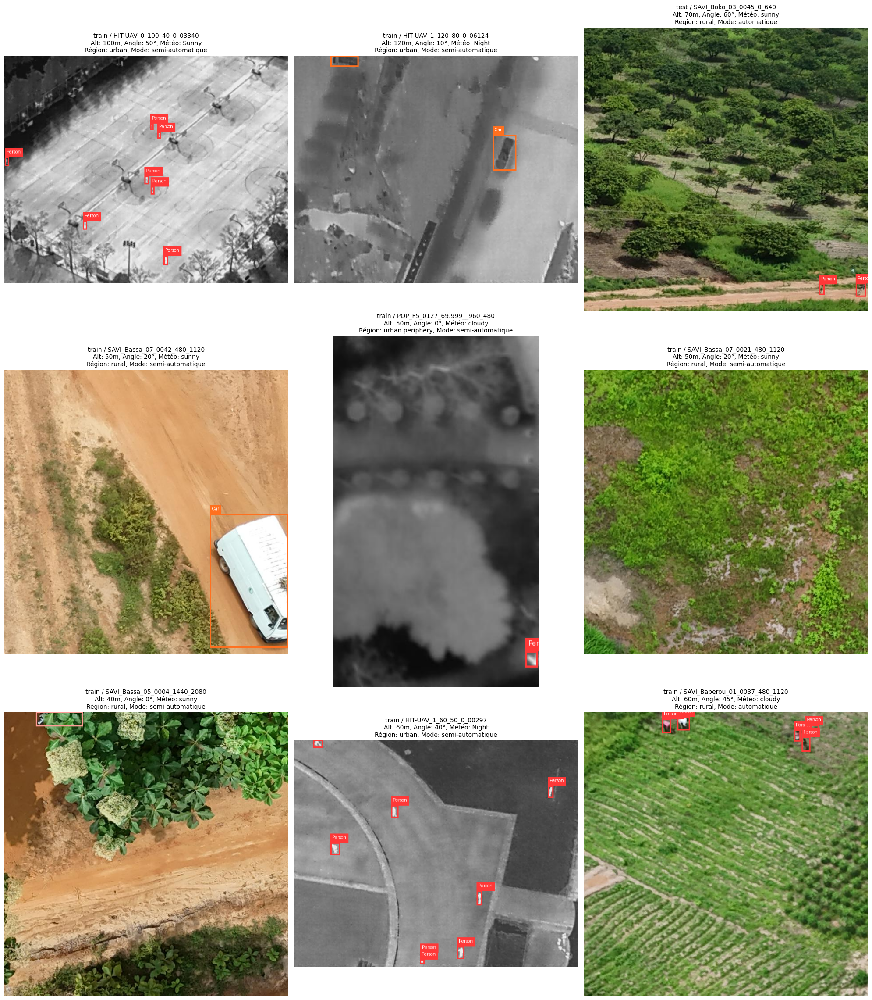

In [4]:
# --- Vérification avec le Fichier de Métadonnées ---

# Charger le fichier CSV
metadata_path = DATASET_DIR / 'metadata_640x640.csv'
df_meta = pd.read_csv(metadata_path)
print("Aperçu du fichier de métadonnées :")
display(df_meta.head())

# Sélectionner un nouvel échantillon aléatoire
sample_paths_meta = random.sample(all_image_paths, k=min(9, len(all_image_paths)))

# Afficher les images dans une grille avec leurs métadonnées
plt.figure(figsize=(20, 24))
for i, path in enumerate(sample_paths_meta):
    plt.subplot(3, 3, i + 1)
    
    # Dessiner les boîtes
    annotated_img = visualize_sample(path)
    plt.imshow(annotated_img)
    
    # Récupérer et formater les métadonnées
    image_id = path.stem
    meta_row = df_meta[df_meta['id'] == image_id]
    
    title_text = f"{path.parent.name} / {image_id}\n" # Nom de base
    if not meta_row.empty:
        meta = meta_row.iloc[0]
        meta_text = (
            f"Alt: {meta['altitude']}m, Angle: {meta['angle']}°, Météo: {meta['meteo']}\n"
            f"Région: {meta['region']}, Mode: {meta['mode']}"
        )
        title_text += meta_text
    else:
        title_text += "Métadonnées non trouvées !"
        
    plt.title(title_text, fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()